# 601 Project 2 : EDA on Sample Insurance Portfolio in Florida for 2012 

Data source: Sample Insurance Portfolio in Florida for 2012 from https://support.spatialkey.com/wpcontent/uploads/2021/02/FL_insurance_sample.csv.zip

I have got the source of this data from the link from Week 2: CSV and Pandas assignment given in DATA 601. It is a CSV file and it is easy and free to download and it is legal to access that data.
The aim of the project would be to analyze the trend of the company that implemented a new and aggressive growth plan in 2012. This dataset has a total insured value for two years i.e 2011, 2012 which can be used for testing out the comparison feature. 

1) Does the newly implemented plan have any changes from 2011 and 2012.

2) Can we predict the 2012 TIV or any percentage raise based on the features provided. If so, how?



# Importing libraries

In [1]:
#importing all the required basic libraries for the project
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt

In [2]:
# It is required to import the zipfile library as the url downloads the zipfile of the insurance data
import zipfile

Data source link:
https://support.spatialkey.com/wp-content/uploads/2021/02/FL_insurance_sample.csv.zip

this downloads the zip file of the insurnace data

# Loading the data
The sample insurance file contains 36,634 records in Florida for 2012 from a sample company that implemented an agressive growth plan in 2012.

In [3]:
#this downloaded file has bytes, hences importing BytesIO from io
from io import BytesIO
#To access the zip file and its content importing the zipfile
from zipfile import ZipFile
#As the data source is in the form of url, hence importing urlopen to open the data source link
from urllib.request import urlopen
zipfile_url = urlopen('https://support.spatialkey.com/wp-content/uploads/2021/02/FL_insurance_sample.csv.zip')

#Download Zipfile and create pandas DataFrame
zipfile = ZipFile(BytesIO(zipfile_url.read()))
ins_data = pd.read_csv(zipfile.open('FL_insurance_sample.csv'))

In [4]:
# printing the data
ins_data

,policyID,statecode,county,eq_site_limit,hu_site_limit,fl_site_limit,fr_site_limit,tiv_2011,tiv_2012,eq_site_deductible,hu_site_deductible,fl_site_deductible,fr_site_deductible,point_latitude,point_longitude,line,construction,point_granularity
0,119736,FL,CLAY COUNTY,498960.0,498960.00,498960.0,498960.0,498960.00,792148.90,0.0,9979.2,0.0,0,30.102261,-81.711777,Residential,Masonry,1
1,448094,FL,CLAY COUNTY,1322376.3,1322376.30,1322376.3,1322376.3,1322376.30,1438163.57,0.0,0.0,0.0,0,30.063936,-81.707664,Residential,Masonry,3
2,206893,FL,CLAY COUNTY,190724.4,190724.40,190724.4,190724.4,190724.40,192476.78,0.0,0.0,0.0,0,30.089579,-81.700455,Residential,Wood,1
3,333743,FL,CLAY COUNTY,0.0,79520.76,0.0,0.0,79520.76,86854.48,0.0,0.0,0.0,0,30.063236,-81.707703,Residential,Wood,3
4,172534,FL,CLAY COUNTY,0.0,254281.50,0.0,254281.5,254281.50,246144.49,0.0,0.0,0.0,0,30.060614,-81.702675,Residential,Wood,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36629,404309,FL,PINELLAS COUNTY,0.0,88722.00,0.0,88722.0,88722.00,155065.65,0.0,0.0,0.0,0,28.122885,-82.770218,Residential,Wood,3
36630,465875,FL,PINELLAS COUNTY,1297057.5,1297057.50,1297057.5,1297057.5,1297057.50,1577500.79,0.0,0.0,0.0,0,28.080900,-82.758800,Residential,Masonry,1
36631,791209,FL,PINELLAS COUNTY,173286.9,173286.90,0.0,0.0,173286.90,205527.97,0.0,0.0,0.0,0,28.110550,-82.766360,Residential,Wood,4
36632,322627,FL,PINELLAS COUNTY,1499781.6,1499781.60,0.0,0.0,1499781.60,1768782.43,0.0,0.0,0.0,0,28.089415,-82.697411,Residential,Masonry,3


In [5]:
#printing the first 5 rows of the data using head()
ins_data.head()

,policyID,statecode,county,eq_site_limit,hu_site_limit,fl_site_limit,fr_site_limit,tiv_2011,tiv_2012,eq_site_deductible,hu_site_deductible,fl_site_deductible,fr_site_deductible,point_latitude,point_longitude,line,construction,point_granularity
0,119736,FL,CLAY COUNTY,498960.0,498960.00,498960.0,498960.0,498960.00,792148.90,0.0,9979.2,0.0,0,30.102261,-81.711777,Residential,Masonry,1
1,448094,FL,CLAY COUNTY,1322376.3,1322376.30,1322376.3,1322376.3,1322376.30,1438163.57,0.0,0.0,0.0,0,30.063936,-81.707664,Residential,Masonry,3
2,206893,FL,CLAY COUNTY,190724.4,190724.40,190724.4,190724.4,190724.40,192476.78,0.0,0.0,0.0,0,30.089579,-81.700455,Residential,Wood,1
3,333743,FL,CLAY COUNTY,0.0,79520.76,0.0,0.0,79520.76,86854.48,0.0,0.0,0.0,0,30.063236,-81.707703,Residential,Wood,3
4,172534,FL,CLAY COUNTY,0.0,254281.50,0.0,254281.5,254281.50,246144.49,0.0,0.0,0.0,0,30.060614,-81.702675,Residential,Wood,1


In [6]:
#printing the last 5 rows of the data using tail()
ins_data.tail()

,policyID,statecode,county,eq_site_limit,hu_site_limit,fl_site_limit,fr_site_limit,tiv_2011,tiv_2012,eq_site_deductible,hu_site_deductible,fl_site_deductible,fr_site_deductible,point_latitude,point_longitude,line,construction,point_granularity
36629,404309,FL,PINELLAS COUNTY,0.0,88722.0,0.0,88722.0,88722.0,155065.65,0.0,0.0,0.0,0,28.122885,-82.770218,Residential,Wood,3
36630,465875,FL,PINELLAS COUNTY,1297057.5,1297057.5,1297057.5,1297057.5,1297057.5,1577500.79,0.0,0.0,0.0,0,28.080900,-82.758800,Residential,Masonry,1
36631,791209,FL,PINELLAS COUNTY,173286.9,173286.9,0.0,0.0,173286.9,205527.97,0.0,0.0,0.0,0,28.110550,-82.766360,Residential,Wood,4
36632,322627,FL,PINELLAS COUNTY,1499781.6,1499781.6,0.0,0.0,1499781.6,1768782.43,0.0,0.0,0.0,0,28.089415,-82.697411,Residential,Masonry,3
36633,398149,FL,PINELLAS COUNTY,373488.3,373488.3,0.0,0.0,373488.3,596003.67,0.0,0.0,0.0,0,28.064440,-82.774590,Residential,Masonry,1


In [7]:
# getting the information of the insurance_data like data types, non-null count values in respective columns
ins_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36634 entries, 0 to 36633
Data columns (total 18 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   policyID            36634 non-null  int64  
 1   statecode           36634 non-null  object 
 2   county              36634 non-null  object 
 3   eq_site_limit       36634 non-null  float64
 4   hu_site_limit       36634 non-null  float64
 5   fl_site_limit       36634 non-null  float64
 6   fr_site_limit       36634 non-null  float64
 7   tiv_2011            36634 non-null  float64
 8   tiv_2012            36634 non-null  float64
 9   eq_site_deductible  36634 non-null  float64
 10  hu_site_deductible  36634 non-null  float64
 11  fl_site_deductible  36634 non-null  float64
 12  fr_site_deductible  36634 non-null  int64  
 13  point_latitude      36634 non-null  float64
 14  point_longitude     36634 non-null  float64
 15  line                36634 non-null  object 
 16  cons

In [8]:
# getting the number of rows and columns of the data
ins_data.shape

(36634, 18)

# Cleaning the data

In [9]:
#checking whether the data has any null values
ins_data.isnull().sum()

policyID              0
statecode             0
county                0
eq_site_limit         0
hu_site_limit         0
fl_site_limit         0
fr_site_limit         0
tiv_2011              0
tiv_2012              0
eq_site_deductible    0
hu_site_deductible    0
fl_site_deductible    0
fr_site_deductible    0
point_latitude        0
point_longitude       0
line                  0
construction          0
point_granularity     0
dtype: int64

In [10]:
#checking whether the data has any 'NA' values
ins_data.isna().sum()

policyID              0
statecode             0
county                0
eq_site_limit         0
hu_site_limit         0
fl_site_limit         0
fr_site_limit         0
tiv_2011              0
tiv_2012              0
eq_site_deductible    0
hu_site_deductible    0
fl_site_deductible    0
fr_site_deductible    0
point_latitude        0
point_longitude       0
line                  0
construction          0
point_granularity     0
dtype: int64

In [11]:
#Replacing any infinity values with the nan values 
ins_data.replace([np.inf, -np.inf], np.nan, inplace = True)

In the imported data, there are four columns that has large number of zero values in the form of '0.0', these values neither involved in calculating the Total insurance value(tiv) nor in any comparision, hence, removed those four columns. They are:
eq_site_deductible,
hu_site_deductible,
fl_site_deductible,
fr_site_deductible,

In [12]:
#Dropping the mentioned the columns and creating a new variable to perform further operations on that.
insurance_data = ins_data.drop(['eq_site_deductible','hu_site_deductible','fl_site_deductible','fr_site_deductible'],axis=1)


In [13]:
#printing the new data after dropping columns
insurance_data

,policyID,statecode,county,eq_site_limit,hu_site_limit,fl_site_limit,fr_site_limit,tiv_2011,tiv_2012,point_latitude,point_longitude,line,construction,point_granularity
0,119736,FL,CLAY COUNTY,498960.0,498960.00,498960.0,498960.0,498960.00,792148.90,30.102261,-81.711777,Residential,Masonry,1
1,448094,FL,CLAY COUNTY,1322376.3,1322376.30,1322376.3,1322376.3,1322376.30,1438163.57,30.063936,-81.707664,Residential,Masonry,3
2,206893,FL,CLAY COUNTY,190724.4,190724.40,190724.4,190724.4,190724.40,192476.78,30.089579,-81.700455,Residential,Wood,1
3,333743,FL,CLAY COUNTY,0.0,79520.76,0.0,0.0,79520.76,86854.48,30.063236,-81.707703,Residential,Wood,3
4,172534,FL,CLAY COUNTY,0.0,254281.50,0.0,254281.5,254281.50,246144.49,30.060614,-81.702675,Residential,Wood,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36629,404309,FL,PINELLAS COUNTY,0.0,88722.00,0.0,88722.0,88722.00,155065.65,28.122885,-82.770218,Residential,Wood,3
36630,465875,FL,PINELLAS COUNTY,1297057.5,1297057.50,1297057.5,1297057.5,1297057.50,1577500.79,28.080900,-82.758800,Residential,Masonry,1
36631,791209,FL,PINELLAS COUNTY,173286.9,173286.90,0.0,0.0,173286.90,205527.97,28.110550,-82.766360,Residential,Wood,4
36632,322627,FL,PINELLAS COUNTY,1499781.6,1499781.60,0.0,0.0,1499781.60,1768782.43,28.089415,-82.697411,Residential,Masonry,3


In [14]:
#Counting the categorical variable 'line' and values of each category
insurance_data.line.value_counts()

Residential    30838
Commercial      5796
Name: line, dtype: int64

In [15]:
#Calculating the average of every column by grouping by the each category of line column
line_df = insurance_data.groupby(['line']).mean()
line_df.head()

,policyID,eq_site_limit,hu_site_limit,fl_site_limit,fr_site_limit,tiv_2011,tiv_2012,point_latitude,point_longitude,point_granularity
line,,,,,,,,,,
Commercial,544382.090407,4.224514e+06,1.140918e+07,3.902401e+06,5.718759e+06,1.200993e+07,1.416342e+07,27.690465,-81.514686,1.491546
Residential,549466.334101,7.496218e+04,3.198667e+05,5.605668e+04,1.026228e+05,3.240003e+05,3.922096e+05,28.162095,-81.976655,1.668980


# Visualizing the data

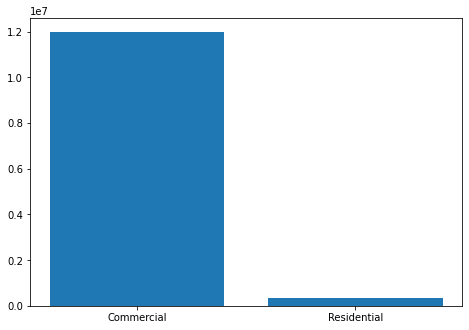

In [16]:
#Now plotting the bar graph for tiv_2011 based on the each category of line column
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.bar(list(line_df.index),line_df['tiv_2011'])
plt.show()

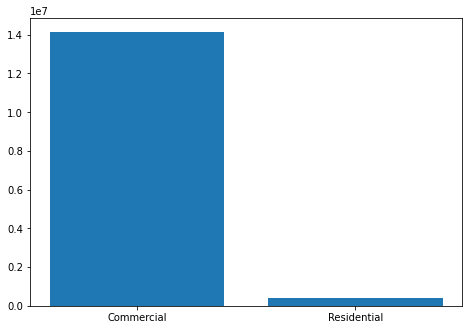

In [17]:
#Similarly, plotting the bar graph for tiv_2012 
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.bar(list(line_df.index),line_df['tiv_2012'])
plt.show()

 This shows commercial property has greater value than residential property
 
 This also says the total insurance value in 2012 is more than 2011

In [18]:
#Counting the categorical variable 'construction' and values of each category
insurance_data.construction.value_counts()

Wood                   21581
Masonry                 9257
Reinforced Masonry      4225
Reinforced Concrete     1299
Steel Frame              272
Name: construction, dtype: int64

In [22]:
#Calculating the average of every column by grouping by the each category of construction column
construction_df = insurance_data.groupby(['construction']).mean()
construction_df

,policyID,eq_site_limit,hu_site_limit,fl_site_limit,fr_site_limit,tiv_2011,tiv_2012,point_latitude,point_longitude,point_granularity
construction,,,,,,,,,,
Masonry,551378.484606,1.938785e+05,8.496695e+05,1.454414e+05,2.701888e+05,8.608683e+05,1.041986e+06,27.912242,-81.718078,1.516474
Reinforced Concrete,543631.159353,4.015452e+06,1.601223e+07,3.313605e+06,6.748501e+06,1.665118e+07,2.021243e+07,27.724533,-81.567918,1.501925
Reinforced Masonry,543694.697988,7.122957e+05,3.709712e+06,6.529686e+05,1.526479e+06,3.824857e+06,4.621373e+06,27.691648,-81.503285,1.479527
Steel Frame,558645.665441,5.977853e+07,1.090228e+08,5.718805e+07,6.592004e+07,1.169841e+08,1.334925e+08,27.509396,-81.437564,1.628676
Wood,548646.132200,2.395395e+04,9.261205e+04,1.771580e+04,3.074668e+04,9.371507e+04,1.134930e+05,28.269267,-82.087569,1.734396


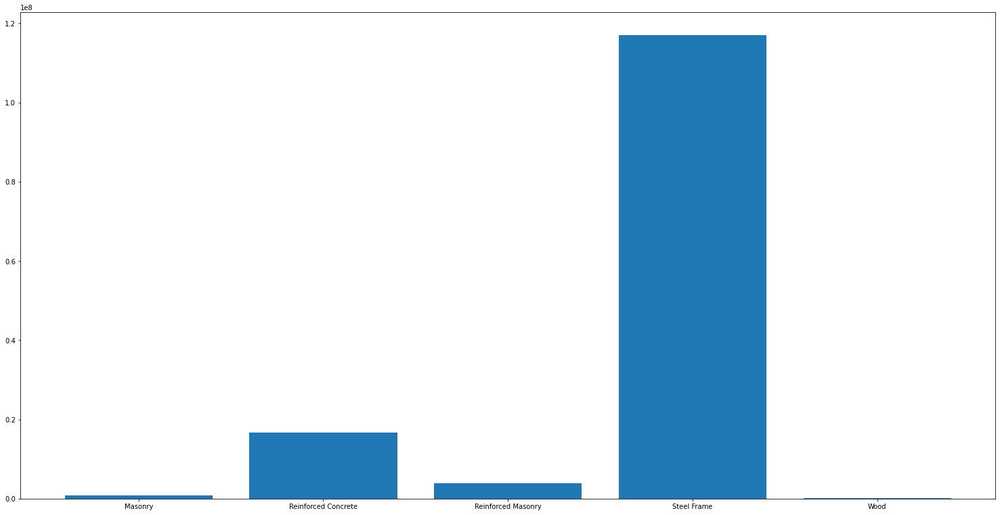

In [105]:
#Now plotting the bar graph for tiv_2011 based on the each category of construction column
fig = plt.figure(figsize = (20,10))
ax = fig.add_axes([0,0,1,1])
ax.bar(list(construction_df.index),construction_df['tiv_2011'])
plt.show()

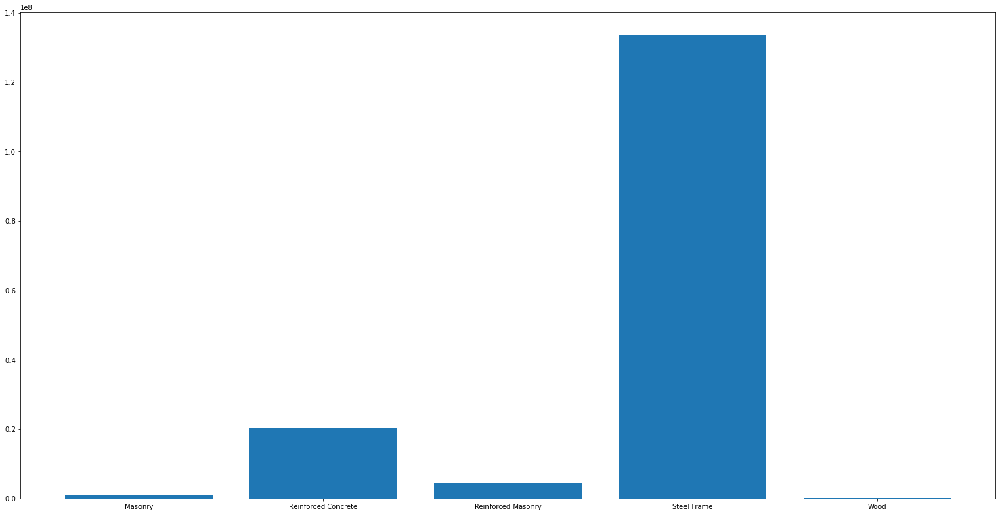

In [106]:
#Similarly, plotting the bar graph for tiv_2012 
fig = plt.figure(figsize = (20,10))
ax = fig.add_axes([0,0,1,1])
ax.bar(list(construction_df.index),construction_df['tiv_2012'])
plt.show()

This shows steel frame type of construction has greater insurance value than others, even though there are least number of insurance policies

<AxesSubplot:xlabel='line,construction'>

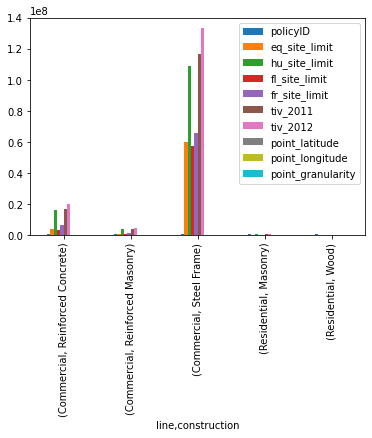

In [25]:
# plotting the bar graph by grouping line, construction to find which type of construction and type of building has more value of insurance
insurance_data.groupby(['line', 'construction']).mean().plot(kind='bar')

This shows that commercial buildings with steel frame type of construction has more value of insurance

<AxesSubplot:xlabel='county,construction'>

<Figure size 2880x2160 with 0 Axes>

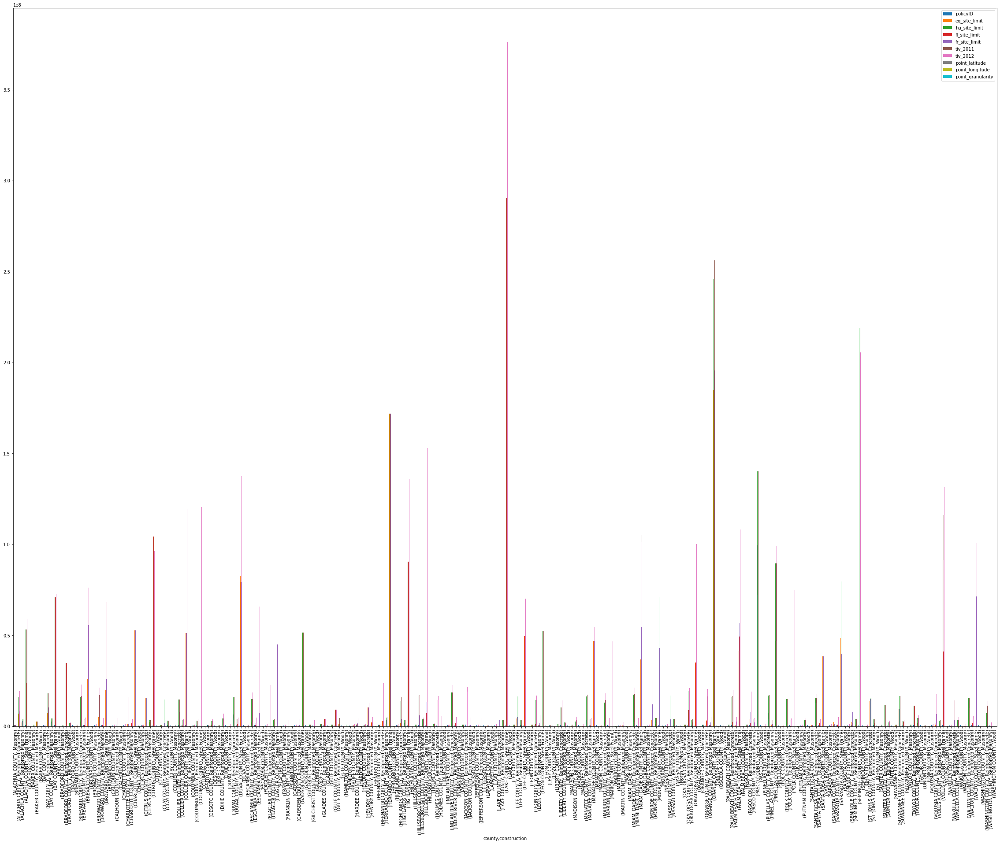

In [103]:
#Now grouping the data by the county and type of construction and plotting the bar graph
plt.figure(figsize = (40,30))
insurance_data.groupby(['county', 'construction']).mean().plot(kind='bar', width =0.8, figsize = (40,30))

<Figure size 2160x1440 with 0 Axes>

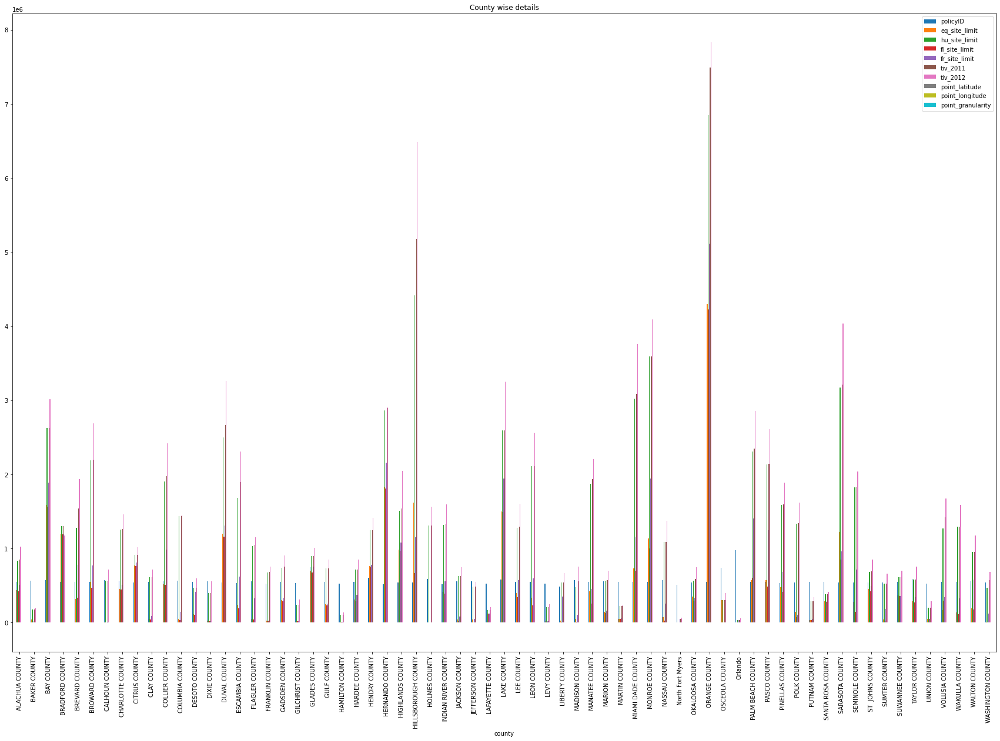

<Figure size 2160x1440 with 0 Axes>

In [101]:
#Getting the county wise details and plotting the bar graph
insurance_data.groupby(['county']).mean().plot(kind='bar',figsize = (30,20))
plt.title('County wise details')
plt.figure(figsize = (30,20))

<AxesSubplot:xlabel='statecode'>

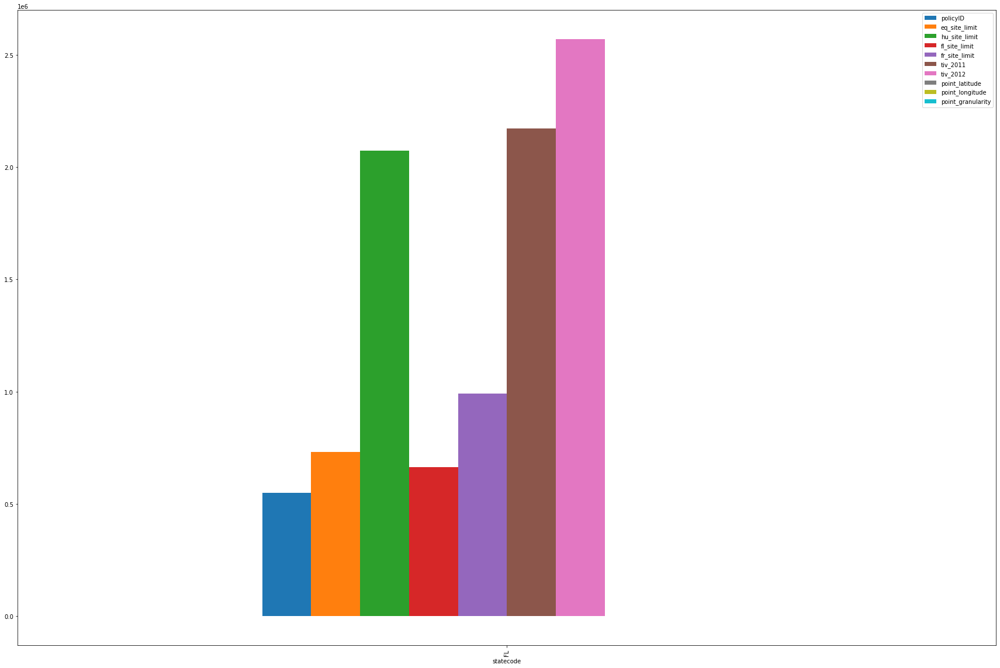

In [100]:
#Grouping the data by the statecode and finding the mean of each column 
insurance_data.groupby(['statecode']).mean().plot(kind='bar', figsize = (30,20))

Here, we can notice that there is increase in tiv_2011 to tiv_2012

In [32]:
#Counting the categorical variable 'construction' and values of each category
insurance_data.construction.value_counts()

Wood                   21581
Masonry                 9257
Reinforced Masonry      4225
Reinforced Concrete     1299
Steel Frame              272
Name: construction, dtype: int64

In [34]:
# Calculating all the statistic values for insurance data
#describe function performs all the values of mean, std, min and max values

insurance_data.describe()

,policyID,eq_site_limit,hu_site_limit,fl_site_limit,fr_site_limit,tiv_2011,tiv_2012,point_latitude,point_longitude,point_granularity
count,36634.000000,3.663400e+04,3.663400e+04,3.663400e+04,3.663400e+04,3.663400e+04,3.663400e+04,36634.000000,36634.000000,36634.000000
mean,548661.937189,7.314780e+05,2.074348e+06,6.646009e+05,9.911724e+05,2.172875e+06,2.571004e+06,28.087477,-81.903565,1.640907
std,259912.926494,1.752300e+07,1.964150e+07,1.746114e+07,1.767178e+07,2.015015e+07,2.036777e+07,1.647734,1.809066,1.070561
min,100074.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,9.000000e+01,7.337000e+01,24.547514,-87.447290,1.000000
25%,323647.750000,0.000000e+00,4.248106e+04,0.000000e+00,0.000000e+00,4.562415e+04,5.401351e+04,26.471996,-82.439331,1.000000
50%,548525.000000,0.000000e+00,1.926911e+05,0.000000e+00,0.000000e+00,2.021051e+05,2.416310e+05,28.057077,-81.585700,1.000000
75%,774252.000000,0.000000e+00,9.163381e+05,0.000000e+00,5.741010e+04,9.465821e+05,1.128871e+06,29.623005,-80.372910,3.000000
max,999971.000000,2.160000e+09,2.160000e+09,2.160000e+09,2.160000e+09,2.160000e+09,1.701000e+09,30.989820,-80.033257,7.000000


In [35]:
#getting the county data into a new variable
county_data = insurance_data['county'].value_counts()

In [36]:
#printing the county data
county_data

MIAMI DADE COUNTY    4315
BROWARD COUNTY       3193
PALM BEACH COUNTY    2791
DUVAL COUNTY         1894
ORANGE COUNTY        1811
                     ... 
GLADES COUNTY          22
UNION COUNTY           15
North Fort Myers        1
Orlando                 1
OSCEOLA COUNTY          1
Name: county, Length: 67, dtype: int64

In [37]:
# Calculating the statistical values of county data
county_data.describe()

count      67.000000
mean      546.776119
std       807.142562
min         1.000000
25%        73.000000
50%       204.000000
75%       732.500000
max      4315.000000
Name: county, dtype: float64

Text(0.5, 1.0, 'COUNTY WISE DATA')

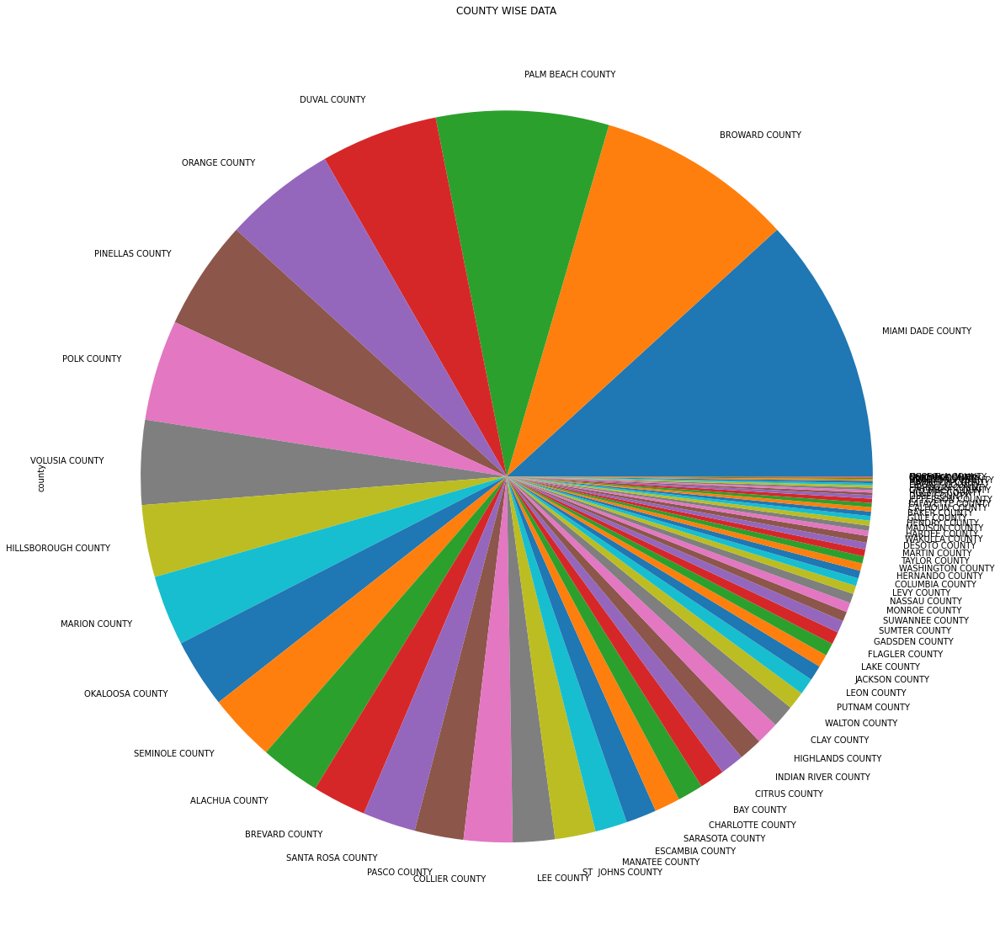

In [38]:
#plotting the pie chart of county wise data
plt.figure(figsize=(30,20))
county_data.plot.pie()
plt.title('COUNTY WISE DATA')

Text(0, 0.5, 'NO OF POLICIES')

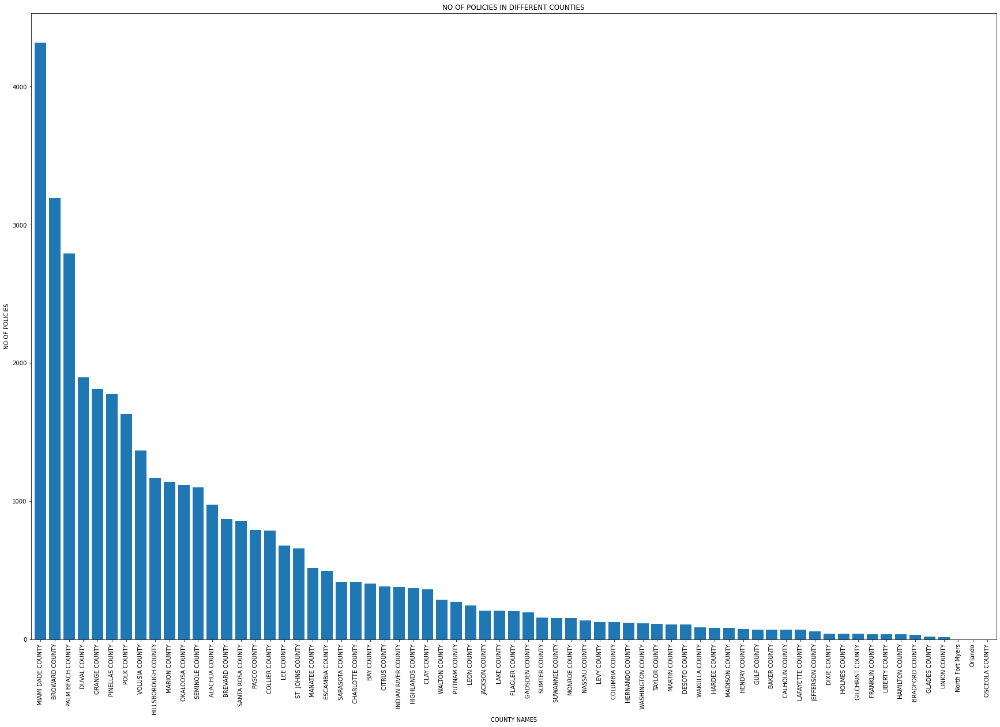

In [39]:
#plotting the bar graph, to show values of policies in different counties
plt.figure(figsize=(30,20))
county_data.plot.bar(width = 0.8,align = 'center')
plt.title('NO OF POLICIES IN DIFFERENT COUNTIES')
plt.xlabel('COUNTY NAMES')
plt.ylabel('NO OF POLICIES')

<AxesSubplot:xlabel='county'>

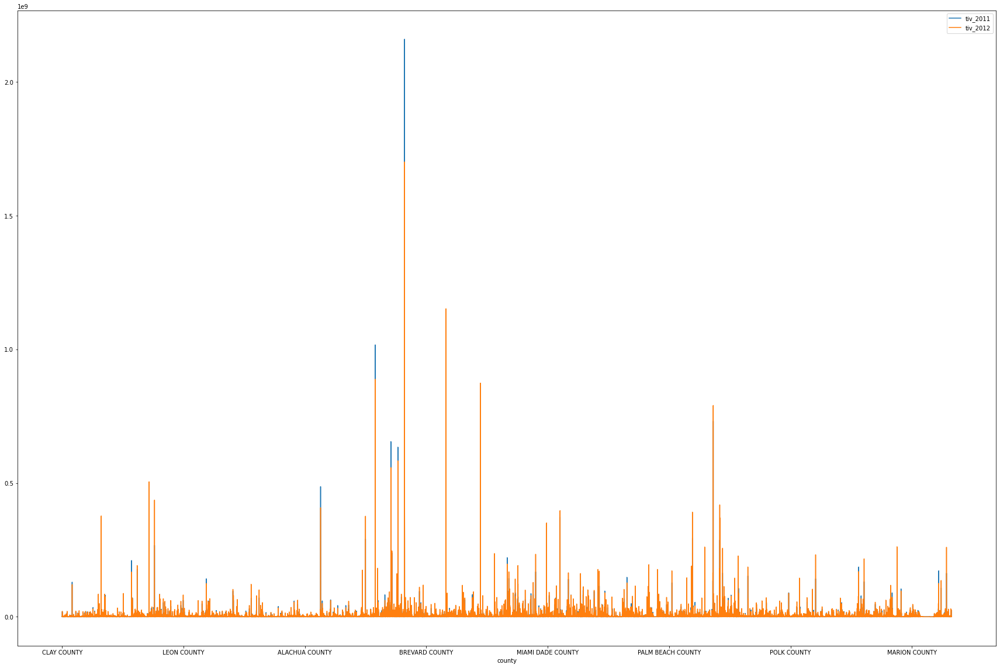

In [41]:
#plotting the line graph to show the variation of tiv in 2011 and tiv 2012 in different counties
insurance_data.plot(x = "county", y = ['tiv_2011','tiv_2012'], figsize = (30, 20))

Here , in almost every county, the new implemented plan is showing its impact of new plan and has a increase in the total insurance value 2012 than 2011

In [44]:
#Getting the line data that contains type of buildings
line_data = insurance_data['line'].value_counts()
line_data

Residential    30838
Commercial      5796
Name: line, dtype: int64

In [45]:
#calculating the statistical values 
line_data.describe()

count        2.000000
mean     18317.000000
std      17707.368014
min       5796.000000
25%      12056.500000
50%      18317.000000
75%      24577.500000
max      30838.000000
Name: line, dtype: float64

<AxesSubplot:xlabel='line'>

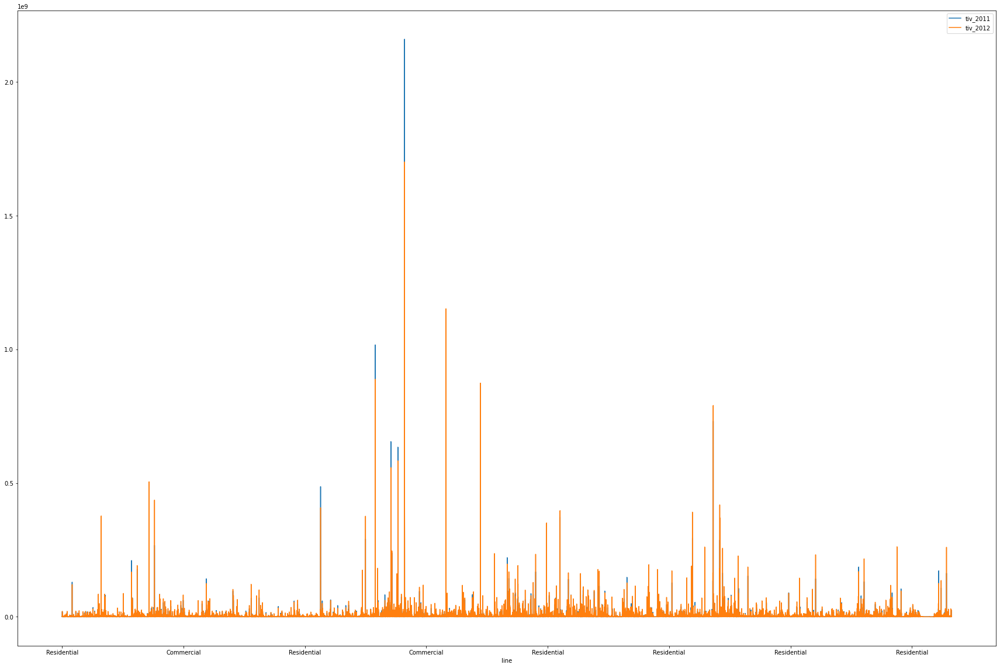

In [49]:
#plotting the line graph to show the variation of tiv in 2011 and tiv 2012
insurance_data.plot(x = "line", y = ['tiv_2011','tiv_2012'], figsize = (30, 20))

In [46]:
#getting the construction type of data
construction_type = insurance_data['construction'].value_counts()

In [47]:
#printing the construction type of data
construction_type

Wood                   21581
Masonry                 9257
Reinforced Masonry      4225
Reinforced Concrete     1299
Steel Frame              272
Name: construction, dtype: int64

In [48]:
#calculating the statistical values of construction type of data
construction_type.describe()

count        5.000000
mean      7326.800000
std       8698.184132
min        272.000000
25%       1299.000000
50%       4225.000000
75%       9257.000000
max      21581.000000
Name: construction, dtype: float64

<AxesSubplot:xlabel='construction'>

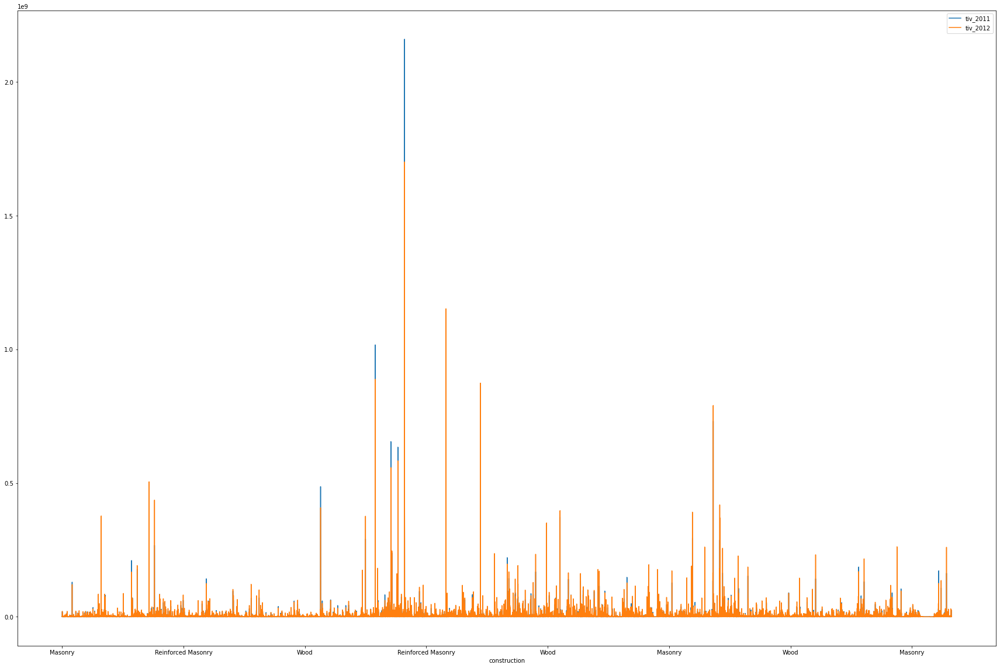

In [50]:
#plotting the line graph to show the variation of tiv in 2011 and tiv 2012 in different type of construction
insurance_data.plot(x = "construction", y = ['tiv_2011','tiv_2012'], figsize = (30, 20))

<AxesSubplot:>

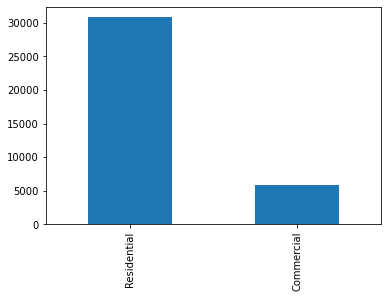

In [51]:
#plotting the line data and showing number of values of each type
line_data.plot.bar()

<AxesSubplot:>

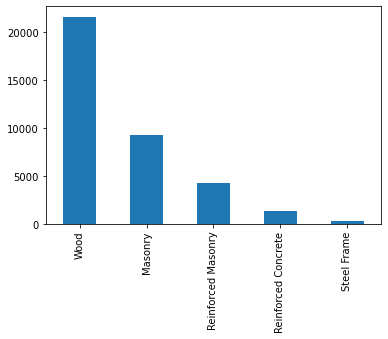

In [52]:
#plotting the construction data and showing number of values of each type of construction
construction_type.plot.bar()

## 1) Does the newly implemented plan have any changes from 2011 and 2012.



In [53]:
#So there are 5 types of construction, gathering each category of data in different variables
#setting the type column as an index to perform further actions based on categorical data
insurance_data.set_index(keys = 'construction', inplace = True)

In [55]:
#getting the wood category of data using filter function and printing
woods = insurance_data.filter(like = 'Wood', axis = 0)
woods

,policyID,statecode,county,eq_site_limit,hu_site_limit,fl_site_limit,fr_site_limit,tiv_2011,tiv_2012,point_latitude,point_longitude,line,point_granularity
construction,,,,,,,,,,,,,
Wood,206893,FL,CLAY COUNTY,190724.4,190724.40,190724.4,190724.4,190724.40,192476.78,30.089579,-81.700455,Residential,1
Wood,333743,FL,CLAY COUNTY,0.0,79520.76,0.0,0.0,79520.76,86854.48,30.063236,-81.707703,Residential,3
Wood,172534,FL,CLAY COUNTY,0.0,254281.50,0.0,254281.5,254281.50,246144.49,30.060614,-81.702675,Residential,1
Wood,223488,FL,CLAY COUNTY,328500.0,328500.00,328500.0,328500.0,328500.00,348374.25,30.102217,-81.707146,Residential,1
Wood,433512,FL,CLAY COUNTY,315000.0,315000.00,315000.0,315000.0,315000.00,265821.57,30.118774,-81.704613,Residential,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
Wood,167630,FL,PINELLAS COUNTY,0.0,4522.50,0.0,4522.5,4522.50,4048.11,28.122885,-82.770218,Residential,3
Wood,241496,FL,PINELLAS COUNTY,0.0,1350.00,0.0,1350.0,1350.00,1430.16,28.122885,-82.770218,Residential,3
Wood,780814,FL,PINELLAS COUNTY,0.0,9770.40,0.0,9770.4,9770.40,9349.98,28.122885,-82.770218,Residential,3


In [56]:
#Getting the rows and columns of the woods data
woods.shape

(21581, 13)

In [57]:
#Getting all the information regarding the wood data
woods.info()

<class 'pandas.core.frame.DataFrame'>
Index: 21581 entries, Wood to Wood
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   policyID           21581 non-null  int64  
 1   statecode          21581 non-null  object 
 2   county             21581 non-null  object 
 3   eq_site_limit      21581 non-null  float64
 4   hu_site_limit      21581 non-null  float64
 5   fl_site_limit      21581 non-null  float64
 6   fr_site_limit      21581 non-null  float64
 7   tiv_2011           21581 non-null  float64
 8   tiv_2012           21581 non-null  float64
 9   point_latitude     21581 non-null  float64
 10  point_longitude    21581 non-null  float64
 11  line               21581 non-null  object 
 12  point_granularity  21581 non-null  int64  
dtypes: float64(8), int64(2), object(3)
memory usage: 2.3+ MB


In [58]:
#calculating the statistical values of woods data
woods.describe()

,policyID,eq_site_limit,hu_site_limit,fl_site_limit,fr_site_limit,tiv_2011,tiv_2012,point_latitude,point_longitude,point_granularity
count,21581.000000,21581.000000,21581.000000,21581.000000,21581.000000,21581.000000,21581.000000,21581.000000,21581.000000,21581.000000
mean,548646.132200,23953.954233,92612.045007,17715.800510,30746.678231,93715.070314,113493.017049,28.269267,-82.087569,1.734396
std,259959.822613,65067.158818,93556.841824,54511.273092,68315.383946,93531.863535,118893.544428,1.663206,1.954097,1.122637
min,100074.000000,0.000000,0.000000,0.000000,0.000000,90.000000,73.370000,24.547514,-87.440800,1.000000
25%,324149.000000,0.000000,16000.220000,0.000000,0.000000,16944.630000,19757.910000,26.650250,-82.523700,1.000000
50%,547680.000000,0.000000,61904.690000,0.000000,0.000000,63633.200000,72871.310000,28.343044,-81.657646,1.000000
75%,775130.000000,315.000000,139778.460000,0.000000,13787.100000,141171.480000,169000.860000,29.821234,-80.445900,3.000000
max,999971.000000,359973.900000,359973.900000,359973.900000,359973.900000,359973.900000,649046.120000,30.989820,-80.033257,7.000000


<AxesSubplot:ylabel='Frequency'>

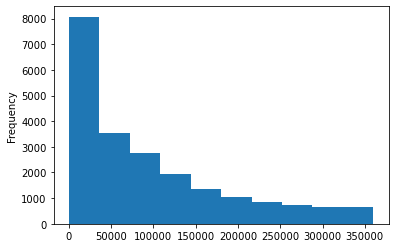

In [59]:
#plotting the histogram to show the range of total insurance values in 2011 
woods['tiv_2011'].plot.hist()

<AxesSubplot:ylabel='Frequency'>

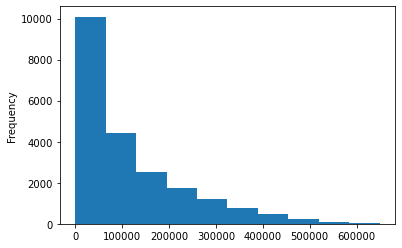

In [60]:
#plotting the histogram to show the range of total insurance values in 2012 
woods['tiv_2012'].plot.hist()

In [74]:
#getting the Masonry type of data without using filter, because if filter is used, then it is extracting the reinforced masonry, hence filter is not used in this case
Masonry = insurance_data[insurance_data.index == 'Masonry']
Masonry

,policyID,statecode,county,eq_site_limit,hu_site_limit,fl_site_limit,fr_site_limit,tiv_2011,tiv_2012,point_latitude,point_longitude,line,point_granularity
construction,,,,,,,,,,,,,
Masonry,119736,FL,CLAY COUNTY,498960.0,498960.00,498960.0,498960.0,498960.00,792148.90,30.102261,-81.711777,Residential,1
Masonry,448094,FL,CLAY COUNTY,1322376.3,1322376.30,1322376.3,1322376.3,1322376.30,1438163.57,30.063936,-81.707664,Residential,3
Masonry,785275,FL,CLAY COUNTY,0.0,515035.62,0.0,0.0,515035.62,884419.17,30.063236,-81.707703,Residential,3
Masonry,142071,FL,CLAY COUNTY,705600.0,705600.00,705600.0,705600.0,705600.00,1010842.56,30.100628,-81.703751,Residential,1
Masonry,253816,FL,CLAY COUNTY,831498.3,831498.30,831498.3,831498.3,831498.30,1117791.48,30.102160,-81.719444,Residential,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
Masonry,645213,FL,PINELLAS COUNTY,0.0,1728847.80,0.0,1728847.8,1728847.80,1449908.58,28.122885,-82.770218,Residential,3
Masonry,546178,FL,PINELLAS COUNTY,0.0,1331880.30,0.0,1331880.3,1331880.30,1770812.11,28.122885,-82.770218,Residential,3
Masonry,465875,FL,PINELLAS COUNTY,1297057.5,1297057.50,1297057.5,1297057.5,1297057.50,1577500.79,28.080900,-82.758800,Residential,1


In [75]:
#getting the rows and columns of masonry data
Masonry.shape

(9257, 13)

In [76]:
#getting the information regaring masonry data
Masonry.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9257 entries, Masonry to Masonry
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   policyID           9257 non-null   int64  
 1   statecode          9257 non-null   object 
 2   county             9257 non-null   object 
 3   eq_site_limit      9257 non-null   float64
 4   hu_site_limit      9257 non-null   float64
 5   fl_site_limit      9257 non-null   float64
 6   fr_site_limit      9257 non-null   float64
 7   tiv_2011           9257 non-null   float64
 8   tiv_2012           9257 non-null   float64
 9   point_latitude     9257 non-null   float64
 10  point_longitude    9257 non-null   float64
 11  line               9257 non-null   object 
 12  point_granularity  9257 non-null   int64  
dtypes: float64(8), int64(2), object(3)
memory usage: 1012.5+ KB


In [77]:
#calculating the statistical values for masonry data
Masonry.describe()

,policyID,eq_site_limit,hu_site_limit,fl_site_limit,fr_site_limit,tiv_2011,tiv_2012,point_latitude,point_longitude,point_granularity
count,9257.000000,9.257000e+03,9.257000e+03,9.257000e+03,9.257000e+03,9.257000e+03,9.257000e+03,9257.000000,9257.000000,9257.000000
mean,551378.484606,1.938785e+05,8.496695e+05,1.454414e+05,2.701888e+05,8.608683e+05,1.041986e+06,27.912242,-81.718078,1.516474
std,259706.567976,3.930914e+05,4.015061e+05,3.612617e+05,4.588334e+05,3.909296e+05,5.336659e+05,1.589849,1.574647,0.986717
min,100141.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.600000e+05,2.611681e+05,24.549093,-87.447290,1.000000
25%,327539.000000,0.000000e+00,5.179440e+05,0.000000e+00,0.000000e+00,5.258700e+05,6.216239e+05,26.333730,-82.391640,1.000000
50%,553231.000000,0.000000e+00,7.573823e+05,0.000000e+00,0.000000e+00,7.643094e+05,9.113239e+05,27.972441,-81.510420,1.000000
75%,776730.000000,0.000000e+00,1.122264e+06,0.000000e+00,4.904550e+05,1.127807e+06,1.352621e+06,29.048700,-80.354378,1.000000
max,999970.000000,1.798200e+06,1.799806e+06,1.798200e+06,1.799806e+06,1.799806e+06,3.234971e+06,30.972105,-80.035889,5.000000


Text(0.5, 0, 'tiv values 2011')

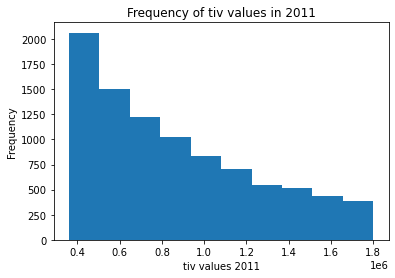

In [82]:
#plotting the histogram to show the range of total insurance values in 2011 
Masonry['tiv_2011'].plot.hist()
plt.title('Frequency of tiv values in 2011')
plt.xlabel('tiv values 2011')

Text(0.5, 0, 'tiv values 2012')

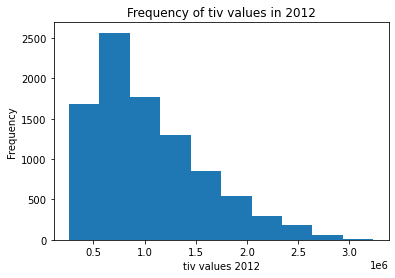

In [83]:
#plotting the histogram to show the range of total insurance values in 2012 
Masonry['tiv_2012'].plot.hist()
plt.title('Frequency of tiv values in 2012')
plt.xlabel('tiv values 2012')

In [84]:
#getting the reinforced masonry data
Reinforced_Masonry = insurance_data.filter(like = 'Reinforced Masonry', axis = 0)
Reinforced_Masonry

,policyID,statecode,county,eq_site_limit,hu_site_limit,fl_site_limit,fr_site_limit,tiv_2011,tiv_2012,point_latitude,point_longitude,line,point_granularity
construction,,,,,,,,,,,,,
Reinforced Masonry,477786,FL,NASSAU COUNTY,2115760.5,2115760.50,0.0,0.0,2115760.50,3057739.39,30.557900,-81.824900,Commercial,4
Reinforced Masonry,233271,FL,COLUMBIA COUNTY,0.0,2135964.60,0.0,2135964.6,2135964.60,1728721.59,30.163641,-82.640976,Commercial,1
Reinforced Masonry,641952,FL,COLUMBIA COUNTY,0.0,2469639.60,0.0,2469639.6,2469639.60,2708463.63,30.151500,-82.612600,Commercial,4
Reinforced Masonry,301822,FL,COLUMBIA COUNTY,0.0,3042940.50,0.0,3042940.5,3042940.50,3181868.99,30.151500,-82.612600,Commercial,4
Reinforced Masonry,123936,FL,COLUMBIA COUNTY,0.0,1920744.90,0.0,1920744.9,1920744.90,2837762.30,30.151500,-82.612600,Commercial,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...
Reinforced Masonry,514807,FL,PINELLAS COUNTY,0.0,1924903.96,0.0,0.0,1924903.96,2610227.52,28.044440,-82.665150,Commercial,1
Reinforced Masonry,190427,FL,PINELLAS COUNTY,0.0,2755988.09,0.0,0.0,2755988.09,4754856.64,28.037260,-82.663368,Commercial,1
Reinforced Masonry,111949,FL,PINELLAS COUNTY,0.0,1868055.46,0.0,0.0,1868055.46,2251630.75,28.044390,-82.679130,Commercial,1


In [85]:
#getting the rows and columns info
Reinforced_Masonry.shape

(4225, 13)

In [86]:
#calculating the statistical values for reinforced masonry data
Reinforced_Masonry.describe()

,policyID,eq_site_limit,hu_site_limit,fl_site_limit,fr_site_limit,tiv_2011,tiv_2012,point_latitude,point_longitude,point_granularity
count,4225.000000,4.225000e+03,4.225000e+03,4.225000e+03,4.225000e+03,4.225000e+03,4.225000e+03,4225.000000,4225.000000,4225.000000
mean,543694.697988,7.122957e+05,3.709712e+06,6.529686e+05,1.526479e+06,3.824857e+06,4.621373e+06,27.691648,-81.503285,1.479527
std,258665.896302,1.663713e+06,1.920391e+06,1.603358e+06,2.282589e+06,1.863190e+06,2.510370e+06,1.582210,1.438641,0.949292
min,100208.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.800000e+06,1.287817e+06,24.548000,-87.434130,1.000000
25%,313786.000000,0.000000e+00,2.265116e+06,0.000000e+00,0.000000e+00,2.324381e+06,2.748692e+06,26.165878,-82.127922,1.000000
50%,547823.000000,0.000000e+00,3.115405e+06,0.000000e+00,0.000000e+00,3.199140e+06,3.869396e+06,27.793990,-81.400030,1.000000
75%,762985.000000,0.000000e+00,4.811006e+06,0.000000e+00,2.670210e+06,4.908546e+06,5.897721e+06,28.744675,-80.297980,1.000000
max,999597.000000,8.984700e+06,8.990982e+06,8.897400e+06,8.967173e+06,8.990982e+06,1.665000e+07,30.959765,-80.035970,4.000000


In [87]:
#getting the information about the reinforced masonry data
Reinforced_Masonry.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4225 entries, Reinforced Masonry to Reinforced Masonry
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   policyID           4225 non-null   int64  
 1   statecode          4225 non-null   object 
 2   county             4225 non-null   object 
 3   eq_site_limit      4225 non-null   float64
 4   hu_site_limit      4225 non-null   float64
 5   fl_site_limit      4225 non-null   float64
 6   fr_site_limit      4225 non-null   float64
 7   tiv_2011           4225 non-null   float64
 8   tiv_2012           4225 non-null   float64
 9   point_latitude     4225 non-null   float64
 10  point_longitude    4225 non-null   float64
 11  line               4225 non-null   object 
 12  point_granularity  4225 non-null   int64  
dtypes: float64(8), int64(2), object(3)
memory usage: 462.1+ KB


Text(0.5, 0, 'tiv values 2011')

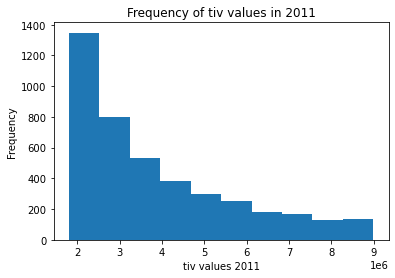

In [88]:
#plotting the histogram to show the range of total insurance values in 2011 
Reinforced_Masonry['tiv_2011'].plot.hist()
plt.title('Frequency of tiv values in 2011')
plt.xlabel('tiv values 2011')

Text(0.5, 0, 'tiv values 2011')

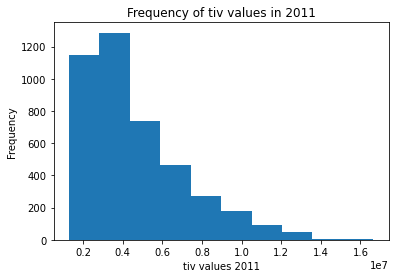

In [89]:
#plotting the histogram to show the range of total insurance values in 2011 
Reinforced_Masonry['tiv_2012'].plot.hist()
plt.title('Frequency of tiv values in 2012')
plt.xlabel('tiv values 2012')

In [90]:
#getting the reinforced concrete data
Reinforced_Concrete = insurance_data.filter(like = 'Reinforced Concrete', axis = 0)
Reinforced_Concrete

,policyID,statecode,county,eq_site_limit,hu_site_limit,fl_site_limit,fr_site_limit,tiv_2011,tiv_2012,point_latitude,point_longitude,line,point_granularity
construction,,,,,,,,,,,,,
Reinforced Concrete,995932,FL,CLAY COUNTY,0.0,19260000.0,0.0,0.0,19260000.0,20610000.00,30.102226,-81.713882,Commercial,1
Reinforced Concrete,671392,FL,CLAY COUNTY,0.0,13410000.0,0.0,0.0,13410000.0,11700000.00,30.091921,-81.711929,Commercial,3
Reinforced Concrete,817283,FL,NASSAU COUNTY,0.0,15390000.0,0.0,15390000.0,15390000.0,11790000.00,30.570221,-81.451309,Commercial,1
Reinforced Concrete,475264,FL,NASSAU COUNTY,0.0,16560000.0,0.0,0.0,16560000.0,20610000.00,30.639568,-81.442482,Commercial,1
Reinforced Concrete,998635,FL,SUWANNEE COUNTY,18900000.0,18900000.0,18900000.0,18900000.0,18900000.0,21420000.00,30.284702,-82.989166,Commercial,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
Reinforced Concrete,478802,FL,PASCO COUNTY,0.0,9000000.0,0.0,0.0,9000000.0,7583846.44,28.301447,-82.704887,Commercial,1
Reinforced Concrete,955043,FL,PASCO COUNTY,0.0,13860000.0,0.0,0.0,13860000.0,20700000.00,28.294106,-82.709137,Commercial,1
Reinforced Concrete,687480,FL,PASCO COUNTY,0.0,18090000.0,0.0,0.0,18090000.0,28800000.00,28.294106,-82.709137,Commercial,1


In [91]:
#getting the info of rows and columns
Reinforced_Concrete.shape

(1299, 13)

In [92]:
#gettin all the information regarding the reinforced conrete
Reinforced_Concrete.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1299 entries, Reinforced Concrete to Reinforced Concrete
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   policyID           1299 non-null   int64  
 1   statecode          1299 non-null   object 
 2   county             1299 non-null   object 
 3   eq_site_limit      1299 non-null   float64
 4   hu_site_limit      1299 non-null   float64
 5   fl_site_limit      1299 non-null   float64
 6   fr_site_limit      1299 non-null   float64
 7   tiv_2011           1299 non-null   float64
 8   tiv_2012           1299 non-null   float64
 9   point_latitude     1299 non-null   float64
 10  point_longitude    1299 non-null   float64
 11  line               1299 non-null   object 
 12  point_granularity  1299 non-null   int64  
dtypes: float64(8), int64(2), object(3)
memory usage: 142.1+ KB


In [93]:
#calculating the statistical values for reinforced concrete data
Reinforced_Concrete.describe()

,policyID,eq_site_limit,hu_site_limit,fl_site_limit,fr_site_limit,tiv_2011,tiv_2012,point_latitude,point_longitude,point_granularity
count,1299.000000,1.299000e+03,1.299000e+03,1.299000e+03,1.299000e+03,1.299000e+03,1.299000e+03,1299.000000,1299.000000,1299.000000
mean,543631.159353,4.015452e+06,1.601223e+07,3.313605e+06,6.748501e+06,1.665118e+07,2.021243e+07,27.724533,-81.567918,1.501925
std,263217.762693,7.998935e+06,7.198729e+06,7.313510e+06,9.024839e+06,6.458193e+06,9.062552e+06,1.576247,1.576080,0.956184
min,100318.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,9.000000e+06,6.416016e+06,24.548443,-87.272316,1.000000
25%,312126.500000,0.000000e+00,1.098000e+07,0.000000e+00,0.000000e+00,1.125000e+07,1.354500e+07,26.207675,-82.344863,1.000000
50%,531447.000000,0.000000e+00,1.485000e+07,0.000000e+00,0.000000e+00,1.512000e+07,1.818000e+07,27.891047,-81.407330,1.000000
75%,766664.000000,0.000000e+00,1.993500e+07,0.000000e+00,1.296000e+07,2.007000e+07,2.511000e+07,28.623468,-80.280783,1.000000
max,999833.000000,3.573000e+07,3.600000e+07,3.555000e+07,3.600000e+07,3.600000e+07,6.057000e+07,30.924482,-80.049515,4.000000


Text(0.5, 0, 'tiv values 2011')

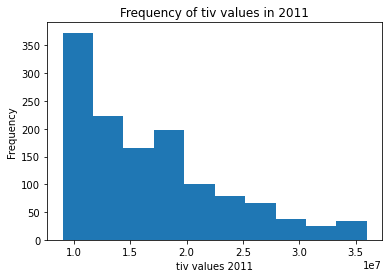

In [94]:
#plotting the histogram to show the range of total insurance values in 2011 
Reinforced_Concrete['tiv_2011'].plot.hist()
plt.title('Frequency of tiv values in 2011')
plt.xlabel('tiv values 2011')

Text(0.5, 0, 'tiv values 2012')

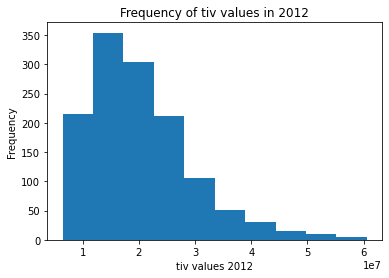

In [95]:
#plotting the histogram to show the range of total insurance values in 2011 
Reinforced_Concrete['tiv_2012'].plot.hist()
plt.title('Frequency of tiv values in 2012')
plt.xlabel('tiv values 2012')

In [96]:
#getting the steel frame data
Steel_Frame = insurance_data.filter(like = 'Steel Frame', axis = 0)
Steel_Frame

,policyID,statecode,county,eq_site_limit,hu_site_limit,fl_site_limit,fr_site_limit,tiv_2011,tiv_2012,point_latitude,point_longitude,line,point_granularity
construction,,,,,,,,,,,,,
Steel Frame,407962,FL,COLUMBIA COUNTY,0.0,129600000.0,0.0,0.0,129600000.0,120600000.0,30.232008,-82.638557,Commercial,3
Steel Frame,896829,FL,DUVAL COUNTY,49410000.0,49410000.0,49410000.0,49410000.0,49410000.0,84780000.0,30.140962,-81.533128,Commercial,4
Steel Frame,858672,FL,FLAGLER COUNTY,0.0,44910000.0,0.0,44910000.0,44910000.0,49410000.0,29.471950,-81.245700,Commercial,3
Steel Frame,181082,FL,VOLUSIA COUNTY,0.0,302400000.0,0.0,0.0,302400000.0,377100000.0,29.242878,-81.109253,Commercial,4
Steel Frame,536035,FL,VOLUSIA COUNTY,82260000.0,82260000.0,82260000.0,82260000.0,82260000.0,84690000.0,29.231760,-81.010120,Commercial,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
Steel Frame,407001,FL,CITRUS COUNTY,104400000.0,104400000.0,104400000.0,104400000.0,104400000.0,96300000.0,28.950718,-82.625893,Commercial,1
Steel Frame,202351,FL,MARION COUNTY,0.0,40590000.0,0.0,0.0,40590000.0,46710000.0,29.188120,-82.137817,Commercial,3
Steel Frame,463464,FL,HERNANDO COUNTY,171900000.0,171900000.0,171900000.0,171900000.0,171900000.0,125100000.0,28.533319,-82.534676,Commercial,1


In [97]:
#getting the info of rows and columns
Steel_Frame.shape

(272, 13)

In [98]:
#getting all the information of steel frame data
Steel_Frame.info()

<class 'pandas.core.frame.DataFrame'>
Index: 272 entries, Steel Frame to Steel Frame
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   policyID           272 non-null    int64  
 1   statecode          272 non-null    object 
 2   county             272 non-null    object 
 3   eq_site_limit      272 non-null    float64
 4   hu_site_limit      272 non-null    float64
 5   fl_site_limit      272 non-null    float64
 6   fr_site_limit      272 non-null    float64
 7   tiv_2011           272 non-null    float64
 8   tiv_2012           272 non-null    float64
 9   point_latitude     272 non-null    float64
 10  point_longitude    272 non-null    float64
 11  line               272 non-null    object 
 12  point_granularity  272 non-null    int64  
dtypes: float64(8), int64(2), object(3)
memory usage: 29.8+ KB


In [107]:
#calculating the statistical values of steel frame data
Steel_Frame.describe()

,policyID,eq_site_limit,hu_site_limit,fl_site_limit,fr_site_limit,tiv_2011,tiv_2012,point_latitude,point_longitude,point_granularity
count,272.000000,2.720000e+02,2.720000e+02,2.720000e+02,2.720000e+02,2.720000e+02,2.720000e+02,272.000000,272.000000,272.000000
mean,558645.665441,5.977853e+07,1.090228e+08,5.718805e+07,6.592004e+07,1.169841e+08,1.334925e+08,27.509396,-81.437564,1.628676
std,266858.924467,1.937804e+08,1.975370e+08,1.939860e+08,1.930024e+08,1.998633e+08,1.904033e+08,1.545680,1.534333,1.078978
min,107651.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.609000e+07,2.979000e+07,24.547726,-87.447290,1.000000
25%,337728.750000,0.000000e+00,4.218750e+07,0.000000e+00,0.000000e+00,4.448250e+07,5.573250e+07,26.081449,-82.139315,1.000000
50%,547179.000000,0.000000e+00,5.953500e+07,0.000000e+00,3.699000e+07,6.273000e+07,7.276500e+07,27.770815,-81.369735,1.000000
75%,823482.500000,5.249250e+07,1.044000e+08,4.945500e+07,6.129000e+07,1.082250e+08,1.244250e+08,28.450022,-80.238825,3.000000
max,999594.000000,2.160000e+09,2.160000e+09,2.160000e+09,2.160000e+09,2.160000e+09,1.701000e+09,30.626261,-80.034882,4.000000


Text(0.5, 0, 'tiv values 2011')

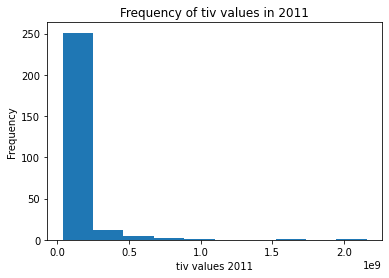

In [108]:
#plotting the histogram to show the range of total insurance values in 2011 
Steel_Frame['tiv_2011'].plot.hist()
plt.title('Frequency of tiv values in 2011')
plt.xlabel('tiv values 2011')

Text(0.5, 0, 'tiv values 2012')

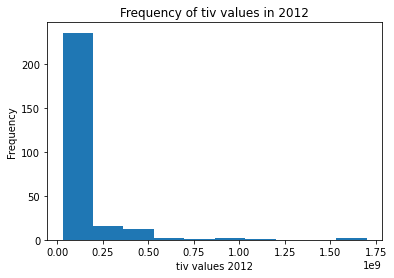

In [109]:
#plotting the histogram to show the range of total insurance values in 2011 
Steel_Frame['tiv_2012'].plot.hist()
plt.title('Frequency of tiv values in 2012')
plt.xlabel('tiv values 2012')

<AxesSubplot:xlabel='construction'>

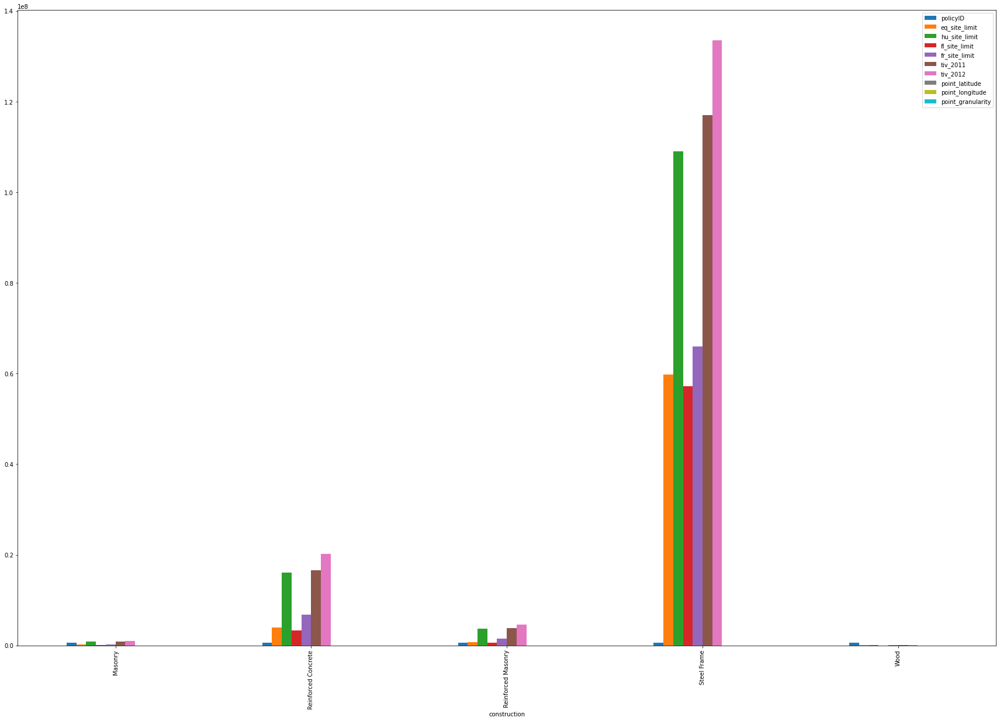

In [110]:
# plotting the bar graph based on type of construction by showing the avg values of each columns
insurance_data.groupby(['construction']).mean().plot(kind='bar',figsize = (30,20))

In [112]:
##Resetting the index value
insurance_data.reset_index(inplace = True)

In [113]:
#Counting the value of statecode
insurance_data['statecode'].value_counts()

FL    36634
Name: statecode, dtype: int64

<AxesSubplot:title={'center':'Variations of TIV in 2011 and 2012'}, xlabel='policyID'>

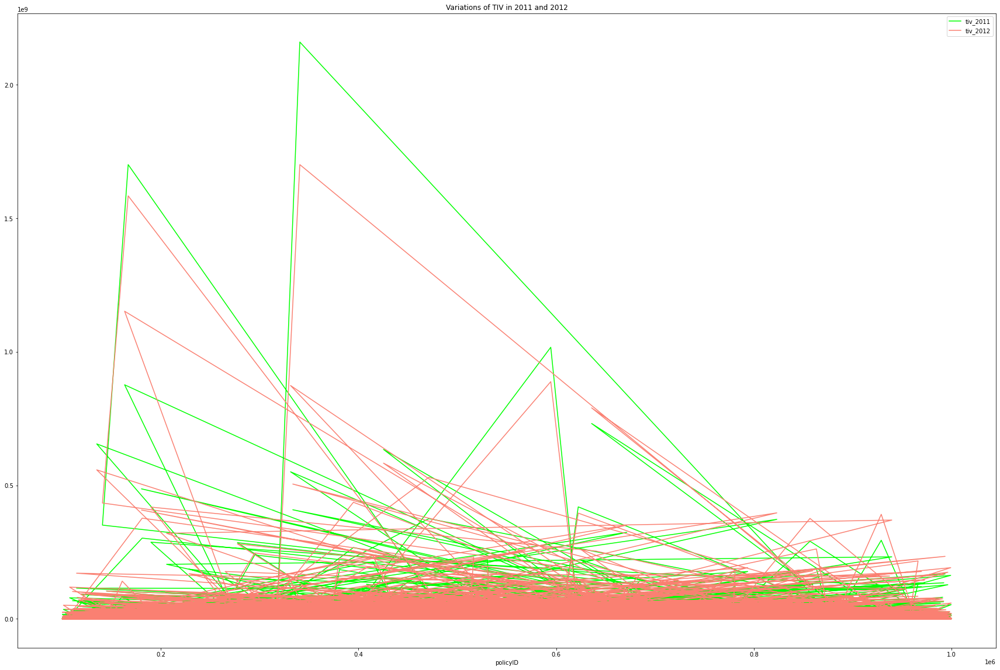

In [119]:
#plotting the variation of tiv 2011, tiv 2012 based on the policyID
tiv_2011 = insurance_data.plot.line(x = 'policyID', y = 'tiv_2011', color = 'lime')
insurance_data.plot.line(x = 'policyID', y = 'tiv_2012', color = 'salmon', title = 'Variations of TIV in 2011 and 2012', ax = tiv_2011, figsize = (30,20))

In [120]:
#calculating the sum of values in tiv_2011
insurance_data['tiv_2011'].sum()

79601102761.83

In [121]:
#calculating the sum of values in tiv_2012
insurance_data['tiv_2012'].sum()

94186164102.03

 ### 2)Can we predict the 2012 TIV or any percentage raise based on the features provided. If so, how?

In [122]:
#calculating the percentage change of each row and storing in the new column in insurance_data
insurance_data['%change'] = ((insurance_data['tiv_2012'] - insurance_data['tiv_2011'])/insurance_data['tiv_2011'])*100

In [123]:
#printing the insurance_data to check the new column
insurance_data

,index,construction,policyID,statecode,county,eq_site_limit,hu_site_limit,fl_site_limit,fr_site_limit,tiv_2011,tiv_2012,point_latitude,point_longitude,line,point_granularity,%change
0,0,Masonry,119736,FL,CLAY COUNTY,498960.0,498960.00,498960.0,498960.0,498960.00,792148.90,30.102261,-81.711777,Residential,1,58.760001
1,1,Masonry,448094,FL,CLAY COUNTY,1322376.3,1322376.30,1322376.3,1322376.3,1322376.30,1438163.57,30.063936,-81.707664,Residential,3,8.756000
2,2,Wood,206893,FL,CLAY COUNTY,190724.4,190724.40,190724.4,190724.4,190724.40,192476.78,30.089579,-81.700455,Residential,1,0.918802
3,3,Wood,333743,FL,CLAY COUNTY,0.0,79520.76,0.0,0.0,79520.76,86854.48,30.063236,-81.707703,Residential,3,9.222397
4,4,Wood,172534,FL,CLAY COUNTY,0.0,254281.50,0.0,254281.5,254281.50,246144.49,30.060614,-81.702675,Residential,1,-3.200001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36629,36629,Wood,404309,FL,PINELLAS COUNTY,0.0,88722.00,0.0,88722.0,88722.00,155065.65,28.122885,-82.770218,Residential,3,74.777000
36630,36630,Masonry,465875,FL,PINELLAS COUNTY,1297057.5,1297057.50,1297057.5,1297057.5,1297057.50,1577500.79,28.080900,-82.758800,Residential,1,21.621500
36631,36631,Wood,791209,FL,PINELLAS COUNTY,173286.9,173286.90,0.0,0.0,173286.90,205527.97,28.110550,-82.766360,Residential,4,18.605601
36632,36632,Masonry,322627,FL,PINELLAS COUNTY,1499781.6,1499781.60,0.0,0.0,1499781.60,1768782.43,28.089415,-82.697411,Residential,3,17.936000


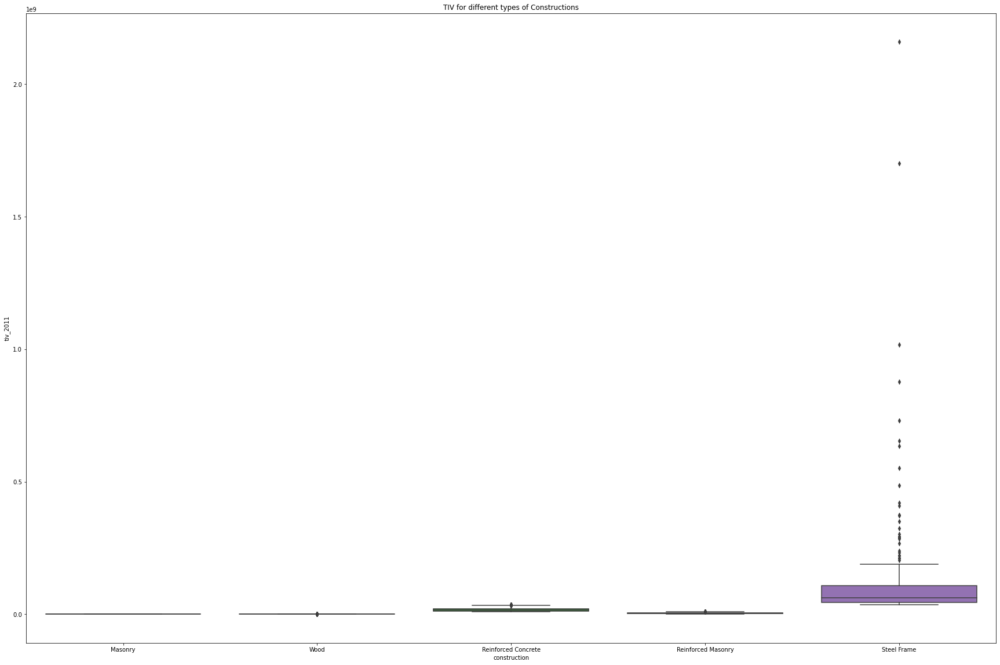

In [124]:
#plotting the boxplot of tiv 2011 w.r.t construction 
plt.figure(figsize=(30,20))
sb.boxplot(y = 'tiv_2011', x = 'construction', data = insurance_data)
plt.title("TIV for different types of Constructions")
plt.show()


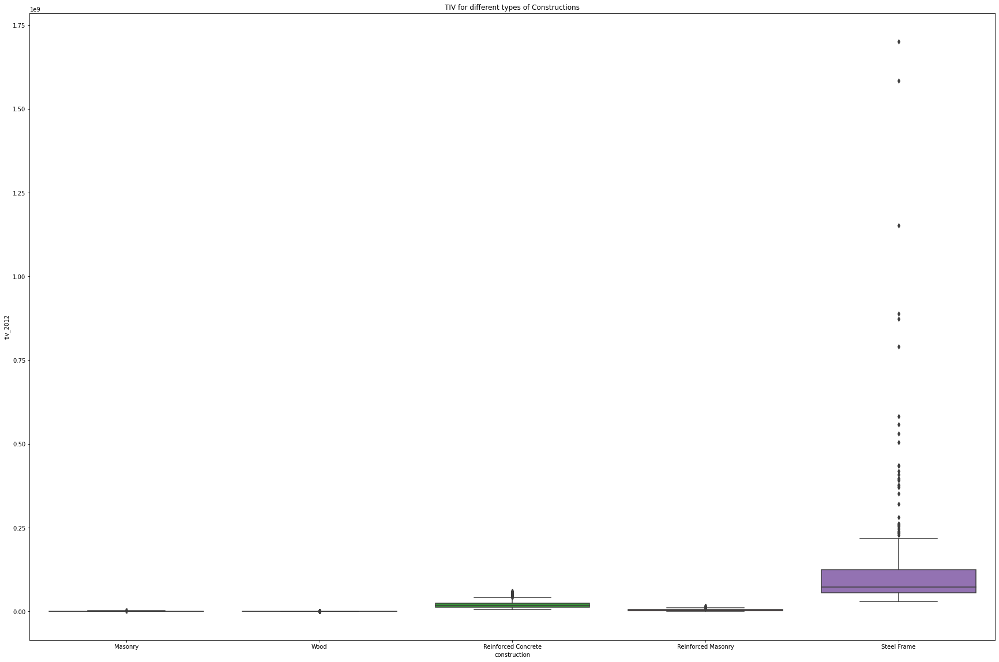

In [125]:
#plotting the boxplot of tiv 2012 w.r.t construction 
plt.figure(figsize=(30,20))
sb.boxplot(y = 'tiv_2012', x = 'construction', data = insurance_data)
plt.title("TIV for different types of Constructions")
plt.show()

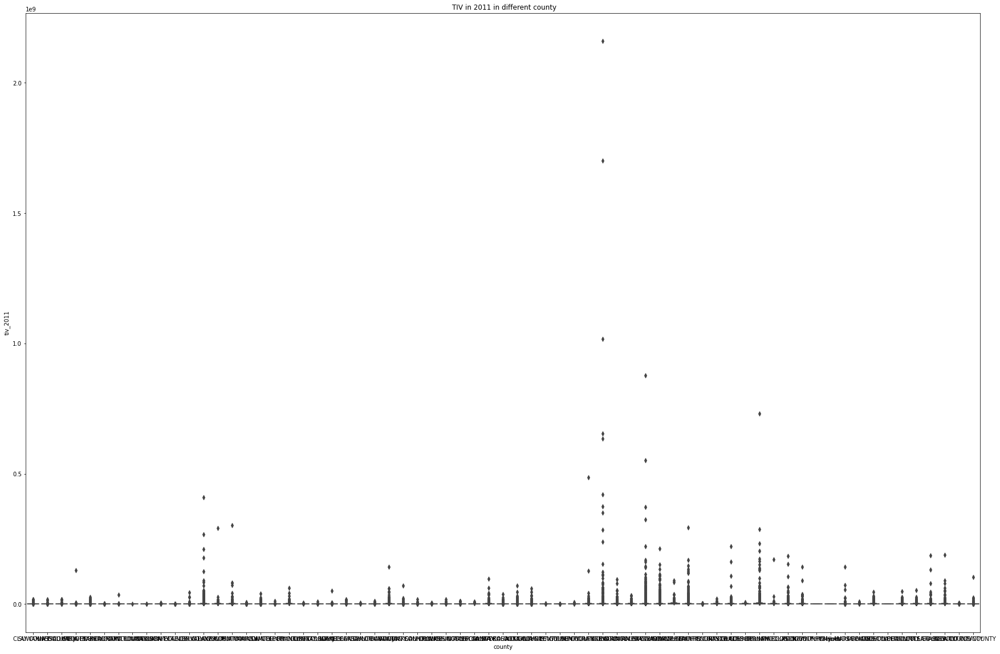

In [126]:
#plotting the boxplot of tiv 2011 w.r.t county
plt.figure(figsize=(30,20))
sb.boxplot(y = 'tiv_2011', x = 'county', data = insurance_data)
plt.title(" TIV in 2011 in different county")
plt.show()

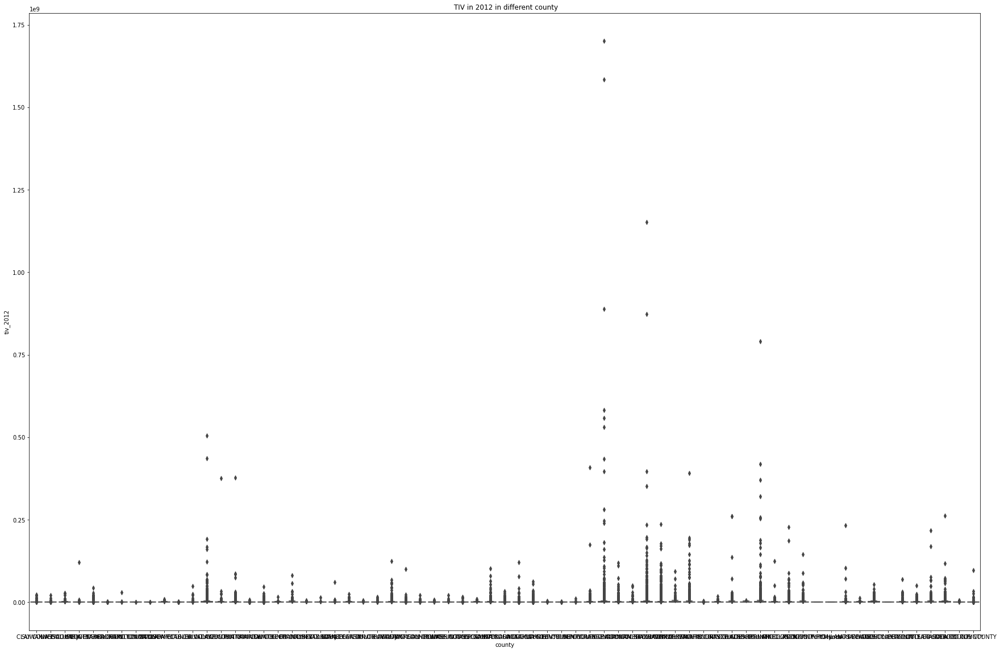

In [127]:
#plotting the boxplot of tiv 2011 w.r.t county
plt.figure(figsize=(30,20))
sb.boxplot(y = 'tiv_2012', x = 'county', data = insurance_data)
plt.title(" TIV in 2012 in different county")
plt.show()

In [128]:
#corr() is used to find the pairwise correlation of all columns in the dataframe
insurance_data.corr()

,index,policyID,eq_site_limit,hu_site_limit,fl_site_limit,fr_site_limit,tiv_2011,tiv_2012,point_latitude,point_longitude,point_granularity,%change
index,1.000000,-0.004701,-0.002719,0.004719,-0.004954,-0.002283,0.003950,0.006521,-0.588342,0.247558,-0.049100,0.004615
policyID,-0.004701,1.000000,-0.005278,-0.010772,-0.005034,-0.005077,-0.010144,-0.009881,-0.003114,0.003450,0.007255,0.002991
eq_site_limit,-0.002719,-0.005278,1.000000,0.888743,0.983463,0.973441,0.866644,0.786223,-0.001993,0.005551,0.007615,-0.011595
hu_site_limit,0.004719,-0.010772,0.888743,1.000000,0.883024,0.889365,0.975598,0.941141,-0.024579,0.023827,0.003154,-0.011123
fl_site_limit,-0.004954,-0.005034,0.983463,0.883024,1.000000,0.985513,0.863712,0.779331,-0.001327,0.006361,0.009814,-0.012106
fr_site_limit,-0.002283,-0.005077,0.973441,0.889365,0.985513,1.000000,0.873725,0.794160,-0.008160,0.012174,0.007351,-0.012532
tiv_2011,0.003950,-0.010144,0.866644,0.975598,0.863712,0.873725,1.000000,0.973050,-0.023168,0.023830,0.002521,-0.011099
tiv_2012,0.006521,-0.009881,0.786223,0.941141,0.779331,0.794160,0.973050,1.000000,-0.028938,0.028259,-0.000905,0.016001
point_latitude,-0.588342,-0.003114,-0.001993,-0.024579,-0.001327,-0.008160,-0.023168,-0.028938,1.000000,-0.708585,0.084803,-0.003417
point_longitude,0.247558,0.003450,0.005551,0.023827,0.006361,0.012174,0.023830,0.028259,-0.708585,1.000000,-0.037129,0.003201


<AxesSubplot:>

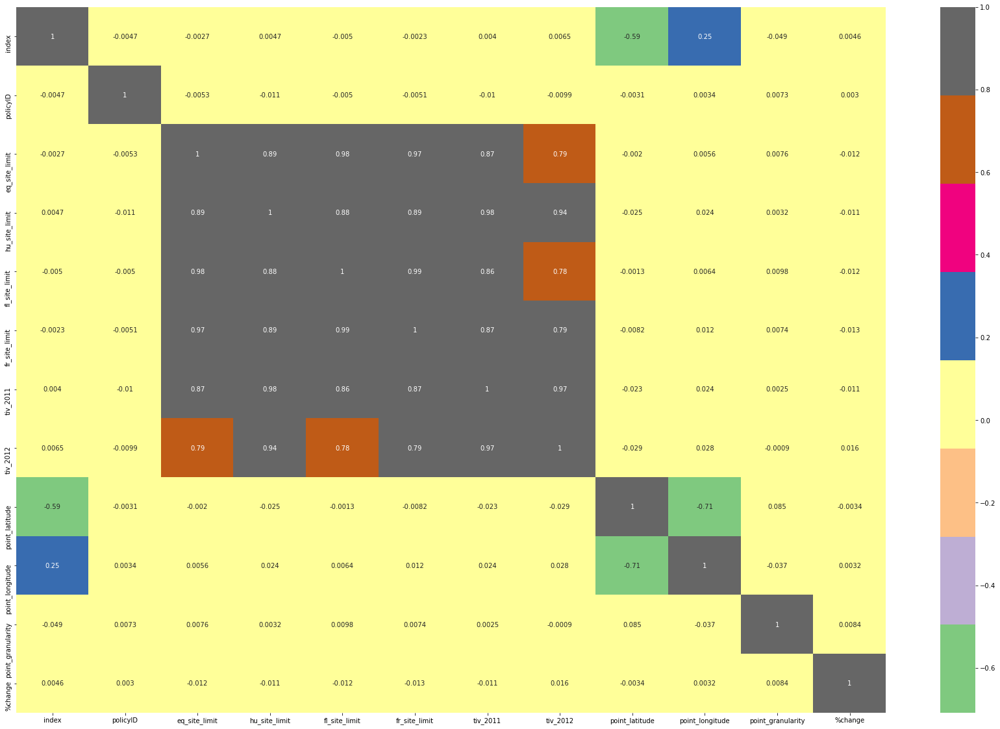

In [129]:
#converting the correlation data of the realestate data into the heat map
plt.figure(figsize = (30,20))
sb.heatmap(insurance_data.corr(), annot = True, cmap = 'Accent')

# Plotting the interactive map

In [130]:
#installing plotly to plot the map with latitude and longitude
!pip install plotly

In [131]:
#importing plotly.express to plot 
import plotly.express as px
fig = px.scatter_geo(insurance_data,lat=insurance_data['point_latitude'],lon=insurance_data['point_longitude'], hover_name="tiv_2011")
fig.update_layout(title = 'World map TIV 2011', title_x=0.5)
fig.show()

In [132]:
#used the scatter_geo for plotting the points of latitude and longitude based on tiv 2012 data
fig = px.scatter_geo(insurance_data,lat=insurance_data['point_latitude'],lon=insurance_data['point_longitude'], hover_name="tiv_2012")
fig.update_layout(title = 'World map TIV 2012', title_x=0.5)
fig.show()

### With this description, we got to know that the newly implemented plan by an insurance company in 2012 has created lot of changes in the total insurance values of Florida State. Hence the new implemented plan succeded in reaching higher sales figures. We also noted the percentage change in each policy in different counties across the states.


### References:
#### https://stackoverflow.com/questions/53233228/plot-latitude-longitude-from-csv-in-python-3-6
#### https://www.tutorialspoint.com/matplotlib/matplotlib_bar_plot.htm
#### https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.filter.html